## Introduction

This notebook is intended to showcase uses of the [Total Variation](https://hal.archives-ouvertes.fr/hal-00437581/document) to define opacity masks that behave like high-pass filters to isolate noise and/or edges.

### About the Total Variation

The TV is defined as the norm of the gradient along the 2 principal directions of the picture. Several norms are available, here we use L1 (sum of absolute values) and L2 (root square of the sum of squares).

Let $u$ be the image represented by $\vec{u}$, a vector of dimension 3 having $i \times j$ pixels and $k$ channels. We will note $\vec{u}_{i, j}$ the RGB sub-vector associated to the pixel located at the coordinate $[i ; j]$. Then :

$$ TV(i, j, k) = \left\Vert \nabla \vec{u}_{i, j, k} \right\Vert  = \left\Vert \dfrac{\partial \vec{u}_{i, j, k}}{\partial x} ; \dfrac{\partial \vec{u}_{i, j, k}}{\partial y} \right\Vert $$

A general form of the $p$-norm of $\nabla \vec{u}_{i, j, k}$ is : 

$$ TV_p(i, j, k) = \left(\left\vert \dfrac{\partial \vec{u}_{i, j, k}}{\partial x} \right\vert ^p + \left\vert \dfrac{\partial \vec{u}_{i, j, k}}{\partial y} \right\vert^p \right)^{1/p}$$

### TV L1 norm

For each pixel $\vec{u}_{i, j} $, we compute on each channel $k$ :

$$ TV_1(i, j, k) = \left| \dfrac{\partial \vec{u}_{i, j, k}}{\partial x} \right| + \left| \dfrac{\partial \vec{u}_{i, j, k}}{\partial y} \right|$$

The L1 norm is known to detect noise and preserve edges (outliers).

### TV L2 norm 

For each pixel $\vec{u}_{i, j} $, we compute on each channel $k$ :

$$ TV_2(i, j, k) = \sqrt{\left( \dfrac{\partial \vec{u}_{i, j, k}}{\partial x} \right)^2 + \left( \dfrac{\partial \vec{u}_{i, j, k}}{\partial y} \right)^2}$$

the L2 norm is known to detect both noise and edges.

### Gradient estimations

The most straightforward way to compute a discrete gradient is the first order backward difference:

$$ \begin{cases}
\dfrac{\partial \vec{u}_{i, j, k}}{\partial x} = u_{i, j, k} - u_{i -1, j, k}\\
\dfrac{\partial \vec{u}_{i, j, k}}{\partial y} = u_{i, j, k} - u_{i , j-1, k}\\
\end{cases}$$

It is implemented as the 2 neighbours variant in the code below.

The 4 neighbours version computes the TV with forward difference then with backward difference, and averages both. 

The 8 neighbours does the same, but not only along the main axis, it uses the diagonals too, and average backward and forward differences along 4 axes. This is more robust yet more computationaly expensive.

These methods come from [Perrone & Favaro](http://www.cvg.unibe.ch/dperrone/tvdb/). 

## Loading an image

We will work on a low-ISO image, really clean of 12 Mpix, then we will add some gaussian noise on it to simulate an high-ISO one.

In [ ]:
import numpy as np
import scipy.misc
from PIL import Image
import colorsys
import matplotlib.pyplot as plt
import scipy.ndimage
from cython.parallel import parallel, prange
plt.rcParams["figure.figsize"] = (20,20)
%load_ext Cython

In [ ]:
# Load image
im = Image.open("../img/153412.jpg")
#im = scipy.misc.imresize(im, 0.3, interp='lanczos')
#im = Image.fromarray(im)
width, height = im.size
im = np.array(im).astype(np.float32)

plt.imshow(im.astype(np.uint8))
plt.show()

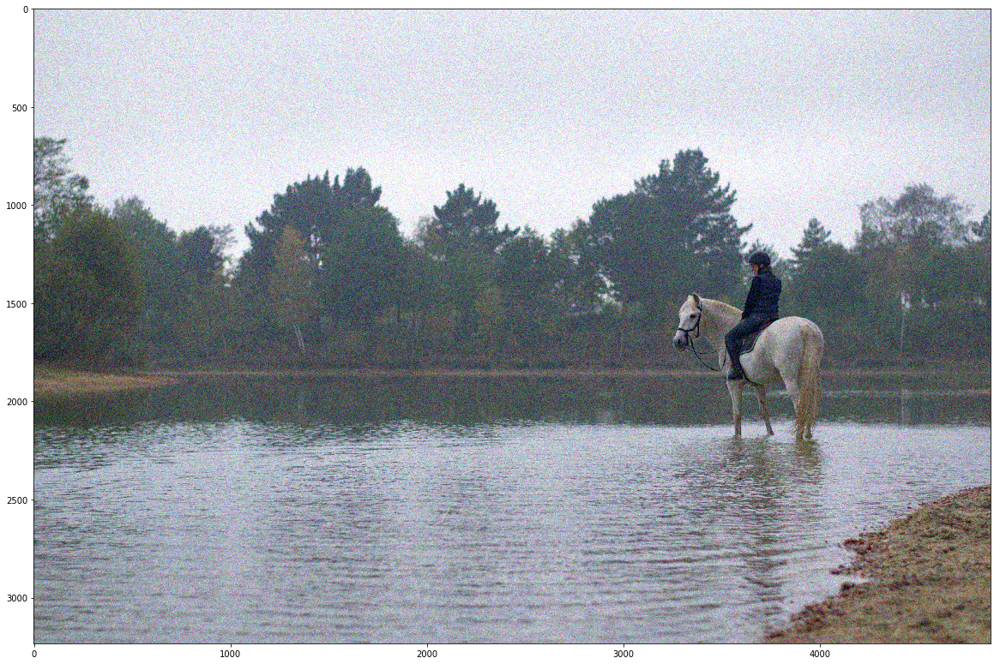

In [162]:
# Synthetize gaussian noise
im_noise = np.clip(np.random.normal(im, 20), 0., 255.).astype(np.float32)
plt.imshow(im_noise.astype(np.uint8))
plt.show()

## Code

This is a Cythonized version of the total variation with 2 norms and 3 variants. We have a function to compute the norm of laplacian the same way as the 8-neighbours variant of the TV. The laplacian is basically the derivative of the gradient.

In [ ]:
%%cython --compile-args=-Ofast --compile-args=-fopenmp --compile-args=-finline-functions --compile-args=-march=native --link-args=-fopenmp --link-args=-finline-functions

# cython: boundscheck=False
# cython: cdivision=True
# cython: wraparound=False
# cython: profile=False

cimport cython
cimport openmp

from cython.parallel cimport parallel, prange
from cython.view cimport array as cvarray

import multiprocessing
cdef int CPU = int(multiprocessing.cpu_count())


cdef extern from "math.h" nogil:
    float fabsf(float)
    float powf(float, float)
    float expf(float)
    int isnan(float)
    float atan2f(float, float)
    float cosf(float)
    float sinf(float)
    
        
cdef inline float norm_L2(float x, float y) nogil:
    return powf(powf(x, 2) + powf(y, 2), 0.5)
    
    
cdef inline float norm_L1(float x, float y) nogil:
    return fabsf(x) + fabsf(y)
    
        
cpdef inline void TV(float[:, :, :] u, float[:, :, :] out, int M, int N, int neighbours, int norm) nogil:
    
    cdef:
        Py_ssize_t i, j, k
        float dxdy
        float udx_forw, udx_back, udy_forw, udy_back, udxdy_back, udxdy_forw, udydx_back, udydx_forw
        
    dxdy = powf(2, 0.5)
    
    ## In this section we treat only the inside of the picture. See the next section for edges and boundaries exceptions
    if neighbours == 8:
        with parallel(num_threads=CPU):
            for i in prange(1, M-1):
                for j in range(1, N-1):
                    for k in range(3):
                        udx_back = u[i, j, k] - u[i-1, j, k] 
                        udy_back = u[i, j, k] - u[i, j-1, k] 

                        udx_forw = -u[i, j, k] + u[i+1, j, k]
                        udy_forw = -u[i, j, k] + u[i, j+1, k]
                        
                        udxdy_back = (u[i, j, k] - u[i-1, j-1, k])/(dxdy)
                        udydx_back = (u[i, j, k] - u[i-1, j+1, k])/(dxdy)
                        
                        udydx_forw = (-u[i, j, k] + u[i+1, j-1, k])/(dxdy)
                        udxdy_forw = (-u[i, j, k] + u[i+1, j+1, k])/(dxdy)
                        
                        if norm == 1:
                            out[i, j, k] = norm_L1(udx_back, udy_back) + norm_L1(udx_forw, udy_forw) + norm_L1(udxdy_back, udydx_back) + norm_L1(udxdy_forw, udydx_forw)
                            
                        elif norm == 2:
                            out[i, j, k] = norm_L2(udx_back, udy_back) + norm_L2(udx_forw, udy_forw) + norm_L2(udxdy_back, udydx_back) + norm_L2(udxdy_forw, udydx_forw)
                            
                        out[i, j, k] /= 4.

                        
    elif neighbours == 4:
        # Evaluate the total variation on 4 neighbours : direct directions, with a bilateral approximation
        with parallel(num_threads=CPU):
            for i in prange(1, M-1):
                for j in range(1, N-1):
                    for k in range(3):
                        udx_back = u[i, j, k] - u[i-1, j, k] 
                        udy_back = u[i, j, k] - u[i, j-1, k] 

                        udx_forw = -u[i, j, k] + u[i+1, j, k]
                        udy_forw = -u[i, j, k] + u[i, j+1, k]
                        
                        if norm == 1:
                            out[i, j, k] = norm_L1(udx_back, udy_back) + norm_L1(udx_forw, udy_forw)
                            
                        elif norm == 2:
                            out[i, j, k] = norm_L2(udx_back, udy_back) + norm_L2(udx_forw, udy_forw)
                            
                        out[i, j, k] /= 2.
                        
    elif neighbours == 2:
        # Evaluate the total variation on 2 neighbours : simple backward difference
        
        with parallel(num_threads=CPU):
            for i in prange(1, M):
                for j in range(1, N):
                    for k in range(3):
                        udx_back = u[i, j, k] - u[i-1, j, k]
                        udy_back = u[i, j, k] - u[i, j-1, k]
                        
                        if norm == 1:
                            out[i, j, k] = norm_L1(udx_back, udy_back)
                            
                        elif norm == 2:
                            out[i, j, k] = norm_L2(udx_back, udy_back)
                            
              
    ## Warning : borders are ignored !!!
    
cpdef inline void Laplacian(float[:, :, :] u, float[:, :, :] out, int M, int N, int neighbours, int norm) nogil:
    
    cdef:
        Py_ssize_t i, j, k
        float dxdy
        float udx, udy, udxdy, udydx
        
    dxdy = powf(2, 0.5)
    
    ## In this section we treat only the inside of the picture. See the next section for edges and boundaries exceptions
    if neighbours == 8:
        with parallel(num_threads=CPU):
            for i in prange(1, M-1):
                for j in range(1, N-1):
                    for k in range(3):
                        udx = -2 * u[i, j, k] + u[i-1, j, k] + u[i+1, j, k]
                        udy = -2 *u[i, j, k] + u[i, j-1, k] + u[i, j+1, k]
                        
                        udxdy = (-2 * u[i, j, k] + u[i-1, j-1, k] + u[i+1, j+1, k])/(dxdy)
                        udydx = (-2 * u[i, j, k] + u[i-1, j+1, k] + u[i+1, j-1, k])/(dxdy)
                        
                        if norm == 1:
                            out[i, j, k] = norm_L1(udx, udy) + norm_L1(udxdy, udydx)
                            
                        elif norm == 2:
                            out[i, j, k] = norm_L2(udx, udy) + norm_L2(udxdy, udydx)
                            
                        out[i, j, k] /= 2.
              
    ## Warning : borders are ignored !!!
    


## Tests

First, let's test the all the norm/neighbours combinations of the TV computation :

In [ ]:
out = np.zeros_like(im).astype(np.float32)
TV(im, out, height, width, 2, 1)
out /= np.amax(out)
print("2 neighbours - L1 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im, out, height, width, 4, 1)
out /= np.amax(out)
print("4 neighbours - L1 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im, out, height, width, 8, 1)
out /= np.amax(out)
print("8 neighbours - L1 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im, out, height, width, 2, 2)
out /= np.amax(out)
print("2 neighbours - L2 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im, out, height, width, 4, 2)
out /= np.amax(out)
print("4 neighbours - L2 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im, out, height, width, 8, 2)
out /= np.amax(out)
print("8 neighbours - L2 norm")
plt.imshow(out)
plt.show()

With both norms, the 8 neighbours version gives more contrast along the edges.

Let's try again with the noisy picture :

In [ ]:
out = np.zeros_like(im).astype(np.float32)
TV(im_noise, out, height, width, 2, 1)
out /= np.amax(out)
print("2 neighbours - L1 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im_noise, out, height, width, 4, 1)
out /= np.amax(out)
print("4 neighbours - L1 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im_noise, out, height, width, 8, 1)
out /= np.amax(out)
print("8 neighbours - L1 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im_noise, out, height, width, 2, 2)
out /= np.amax(out)
print("2 neighbours - L2 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im_noise, out, height, width, 4, 2)
out /= np.amax(out)
print("4 neighbours - L2 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
TV(im_noise, out, height, width, 8, 2)
out /= np.amax(out)
print("8 neighbours - L2 norm")
plt.imshow(out)
plt.show()

Now, we want to study where the L1 and L2 TV norms will both raise outliers. To do so, we will then multiply the 2 outputs and display the gradient maps. First, the clean picture :

In [ ]:
out1 = np.zeros_like(im).astype(np.float32)
TV(im, out1, height, width, 8, 1)
out1 /= np.amax(out1)

out2 = np.zeros_like(im).astype(np.float32)
TV(im, out2, height, width, 8, 2)
out2 /= np.amax(out2)

out = out2 * out1
out /= np.amax(out)
plt.imshow(out)
plt.show()

So it seems that we lose contrast along high-contrast edges (limit between the sky and the trees), which is good because these edges don't seem sharp. What remains are the textures in the focusing area (waves in the water, horse).

Let's redo the same with the noisy picture :

In [ ]:
out1 = np.zeros_like(im).astype(np.float32)
TV(im_noise, out1, height, width, 8, 1)
out1 /= np.amax(out1)

out2 = np.zeros_like(im).astype(np.float32)
TV(im_noise, out2, height, width, 8, 2)
out2 /= np.amax(out2)

out = out2 * out1
out /= np.amax(out)
plt.imshow(out)
plt.show()

Here, we just get the noise, no edges anymore, which is good to mask the noisy pixels from the rest of the picture.

Let's try the laplacian :

In [ ]:
out = np.zeros_like(im).astype(np.float32)
Laplacian(im, out, height, width, 8, 2)
out /= np.amax(out)
print("8 neighbours - L2 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
Laplacian(im, out, height, width, 8, 1)
out /= np.amax(out)
print("8 neighbours - L1 norm")
plt.imshow(out)
plt.show()

The interest of the laplacian is to raise outliers only on sharp edges, and not on out-of-focus contrasty edges, unlike the TV (on the sky-trees limit)

Redo the comparison for the noisy picture :

In [ ]:
out = np.zeros_like(im).astype(np.float32)
Laplacian(im_noise, out, height, width, 8, 2)
out[out < np.mean(out) + 3. * np.std(out)] = 0
out /= np.amax(out)
print("8 neighbours - L2 norm")
plt.imshow(out)
plt.show()

out = np.zeros_like(im).astype(np.float32)
Laplacian(im_noise, out, height, width, 8, 1)
out[out < np.mean(out) + 3. * np.std(out)] = 0
out /= np.amax(out)
print("8 neighbours - L1 norm")
plt.imshow(out)
plt.show()

What happens here is less obvious. The L2 norm seems to have more continuous edges.

## Build a noise mask

The conundrum of noise removal is to preserve the edges. We have seen that the TV is a bit sensitive and doesn't do much separation between noise and edges. The Laplacian is better. 

In [159]:
def noise(im, reference=None, std=8.):
    
    temp = im.copy()

    # Compute the Total Variation + Laplacian along RGB channels
    out = np.zeros_like(temp).astype(np.float32)
    Laplacian(temp, out, height, width, 8, 2)
    
    out2 = np.zeros_like(temp).astype(np.float32)
    TV(temp, out2, height, width, 8, 2)
    
    out = out * out2 + out2**2
    out /= np.amax(out)
    out *= (1 + std * np.pi * np.std(out))
    out[out > 1.] = 1.

    # Display TV histogram
    plt.figure(num=None, figsize=(4, 4), dpi=80, facecolor='w', edgecolor='k')
    plt.hist(out.flatten(), bins='auto')
    plt.title("Histogram of Total Variation")
    plt.show()    

    if reference is not None:
        # Display the histogram of the error between noisy and clean image
        noise = np.abs(im - reference)
        noise /= np.amax(noise)
        plt.figure(num=None, figsize=(4, 4), dpi=80, facecolor='w', edgecolor='k')
        plt.hist(noise.flatten(), bins='auto')
        plt.title("Histogram of actual noise : norm L1 |Noisy - Clean Reference| normalized")
        plt.show()
        
        diff = out - noise

        # Display the histogram of the false positive : pixels detected as noise that are not
        pos = diff[diff > 0]
        pos /= np.amax(pos)
        plt.figure(num=None, figsize=(4, 4), dpi=80, facecolor='w', edgecolor='k')
        plt.hist(pos.flatten(), bins='auto')
        plt.title("Histogram of false positive : norm L1 |TV - actual noise| normalized")
        plt.show()

        print("False positive (average norm of the error - less is better) : ", np.linalg.norm(pos))
        
        # Display the histogram of the false negative : pixels undetected as noise that are
        neg = - diff[diff < 0]
        neg /= np.amax(neg)
        plt.figure(num=None, figsize=(4, 4), dpi=80, facecolor='w', edgecolor='k')
        plt.hist(neg.flatten(), bins='auto')
        plt.title("Histogram of false negative : norm L1 |actual noise - TV| normalized")
        plt.show()

        print("False negative (average norm of the error - less is better) : ", np.linalg.norm(neg))
        
        print("Overall error (average norm of the error - less is better) : ", np.linalg.norm(diff))

    
    # Compute the mask preview in RGB and plot
    display = out
    display = display / np.amax(display) * 255

    
    print("noise mask")
    plt.figure()
    plt.imshow(display.astype(np.uint8))
    plt.show()

    # Basic denoising
    gaussian_blur = scipy.ndimage.filters.gaussian_filter(temp, 15)
    correct = temp.copy()
    # Where the mask > 0 replace the pixels with a weighted average between gaussian blur and source values 
    correct[out > 0.] = gaussian_blur[out > 0.] * out[out > 0.] + temp[out > 0.] * (1 - out[out > 0.])

    print("denoised (basic gaussian blur)")
    plt.imshow(np.clip(correct, 0, 255).astype(np.uint8))
    plt.show()

    print("original - noisy")
    plt.imshow(np.clip(im, 0, 255).astype(np.uint8))
    plt.show()

    print("noise removed (normalized)")
    noise = im - correct
    noise = noise / np.amax(noise) * 255
    plt.imshow(np.clip(noise, 0, 255).astype(np.uint8))
    plt.show()

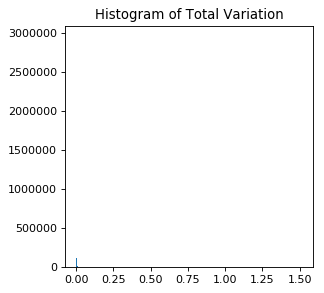

noise mask


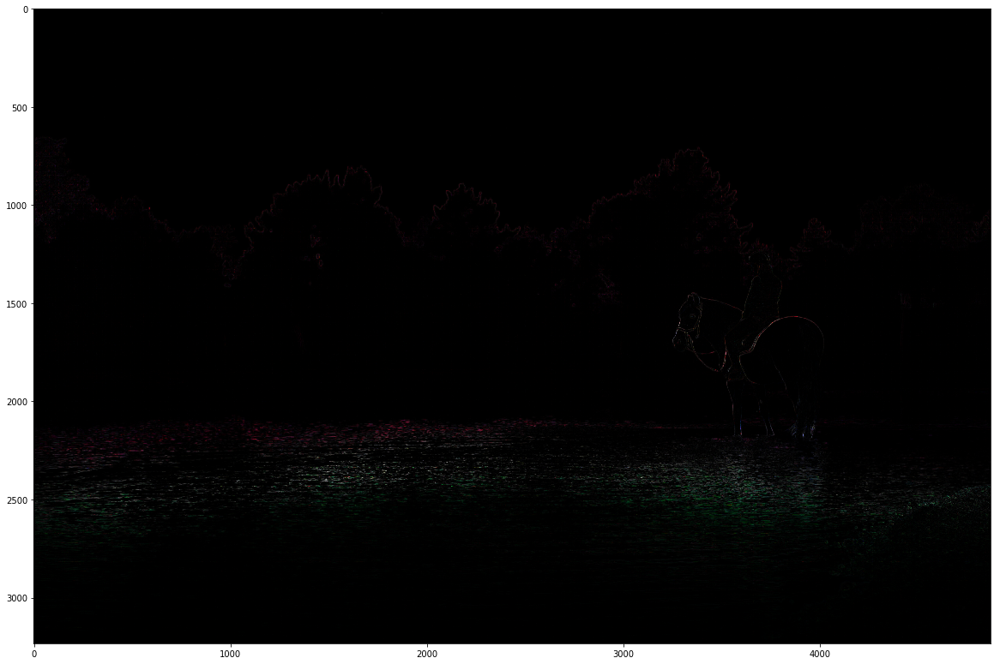

denoised (basic gaussian blur)


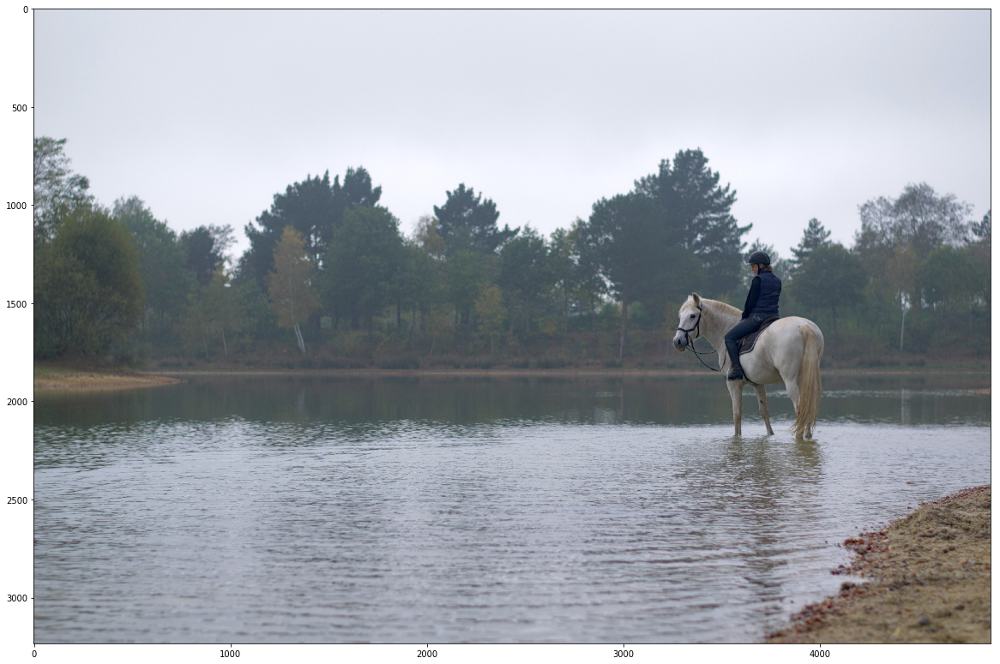

reference


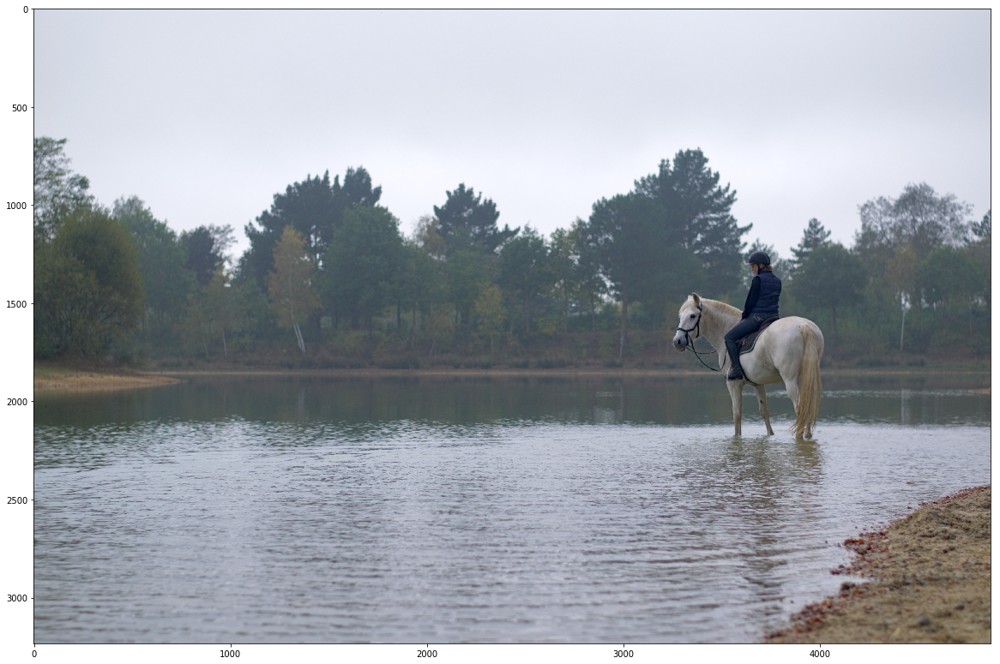

noise removed (normalized)


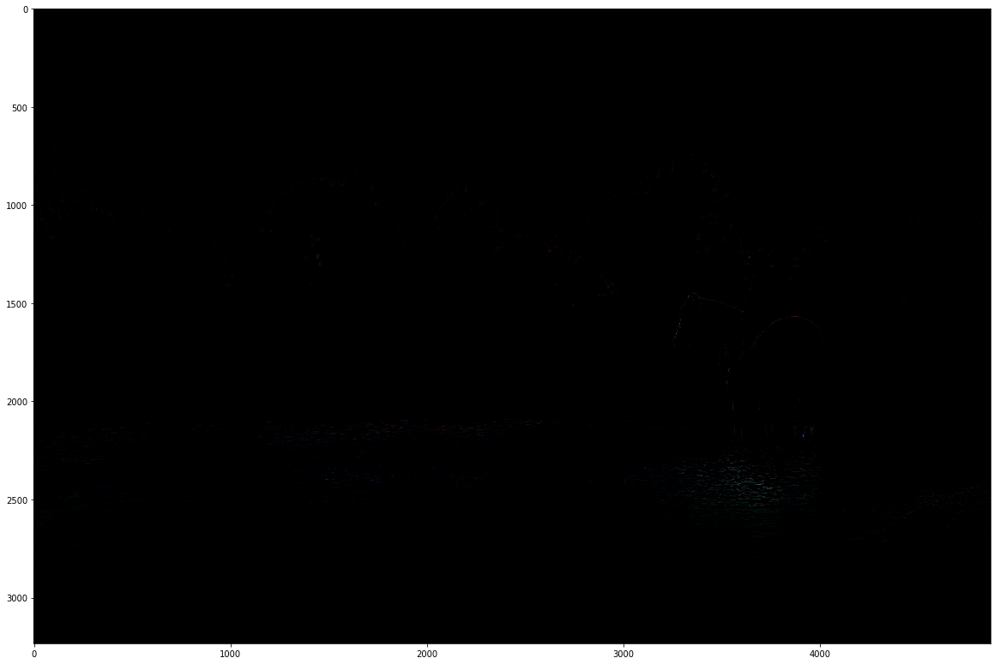

In [141]:
noise(im)

Although the mask detects edges, we observe that it doesn't remove details, but just some over-sharpened contours.

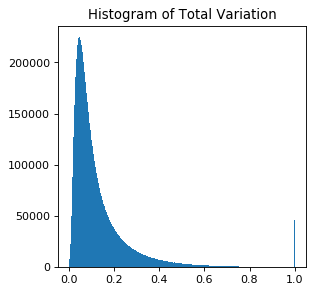

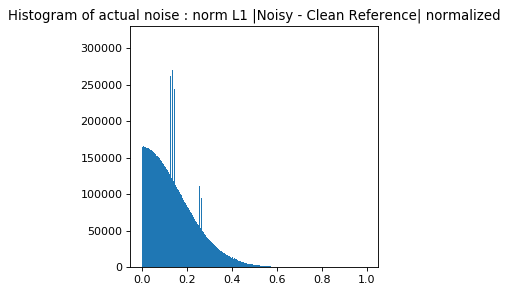

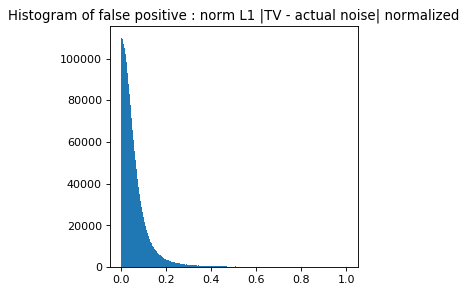

False positive (average norm of the error - less is better) :  401.07773


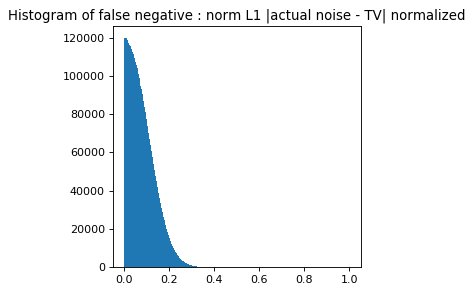

False negative (average norm of the error - less is better) :  527.7401
Overall error (average norm of the error - less is better) :  523.2453
noise mask


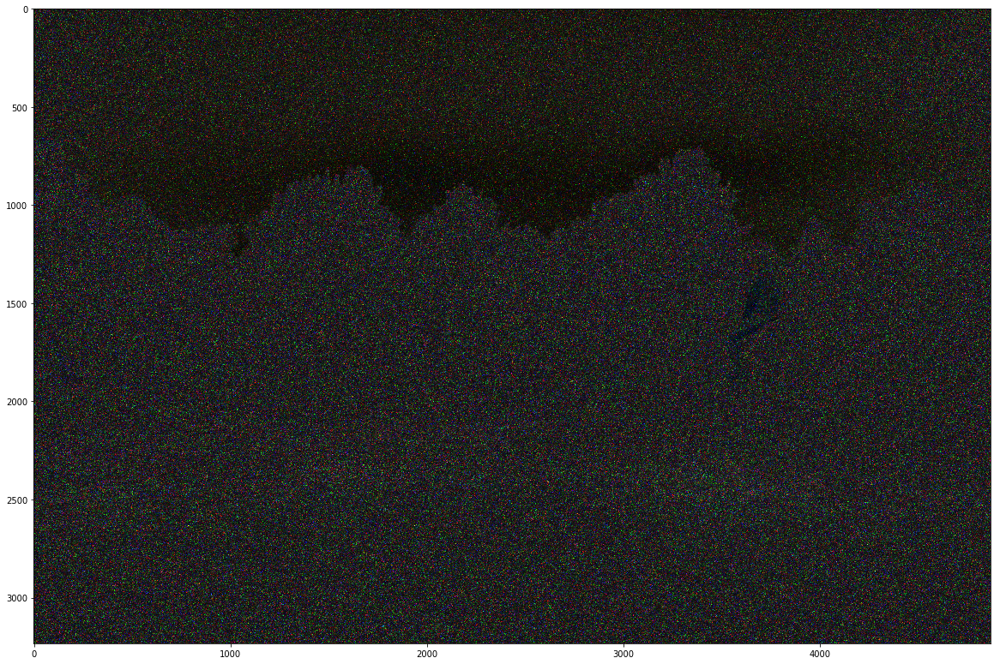

denoised (basic gaussian blur)


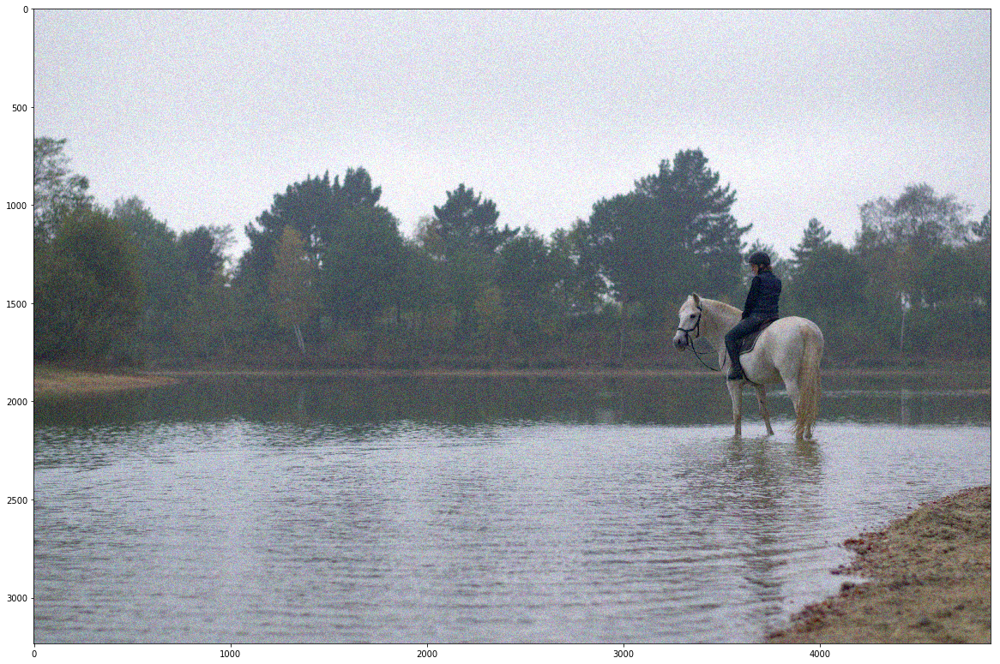

In [ ]:
noise(im_noise, reference=im, std=16.5)

Although the denoising filter is just a simple gaussian blur, we notice that the result is quite good. 

The metrics used show how precisely the mask detects real noise, using a quantitative estimation :
* false-positive are pixels incorrectly detected as noise by the mask or having a higher penalty weight in the mask than expected,
* false-negative are pixels incorrectly detected as correct by the mask or having a lower penalty weight in the mask than expected they should.

Increasing the `std` parameter will increase the amount of false-positive and decrease the amount of false-negative, resulting in an overall error reduction and an heavier smoothing. A value around 16 gives consistently about as much false-positive as false-negative, no matter the gaussian noise deviation.

Decreasing the `std` parameter will give a more conservative mask. A value of 0 gives almost no false-positive.

## Build a sharpness mask

Using the same technic, we can build a sharpness mask to visualize the focusing area on a picture, but this way, we want to avoid the noise.

In [ ]:
def sharpness(im, std=2.):
    """std : deviation factor to clip outliers"""

    # Compute the laplacian
    out1 = np.zeros_like(im).astype(np.float32)
    Laplacian(im, out1, height, width, 8, 2)
    out1 /= np.amax(out1)

    # Compute the Total Variation along RGB channels
    out2 = np.zeros_like(im).astype(np.float32)
    TV(im, out2, height, width, 8, 2)
    out2 /= np.amax(out2)

    out3 = np.zeros_like(im).astype(np.float32)
    TV(im, out3, height, width, 8, 1)
    out3 /= np.amax(out3)

    # Build the mask Laplacian × TV
    out = out2 * out1 * out3
    out /= np.amax(out)

    # Sum the RGB mask along the 3 RGB channels to get a monochrome gradient map
    # This will dilute the noise which is unlikely to affect all RGB channels while poping out sharp edges
    focus = np.sum(out, axis=2)

    # Determine a clipping mask based on the TV stats
    # The threshold is defined as the average TV + n × the TV standard deviation
    threshold = np.mean(focus) + std * np.std(focus)
    focus[focus <= threshold] = 0.
    focus[focus > threshold] =  1.

    # Dilute the mask with a gaussian blur and normalize the values
    # The blur will enlarge the unmasked zones and dilute the noise
    focus =  scipy.ndimage.filters.gaussian_filter(focus, std)
    focus /= focus.max()

    # Compute the screen preview in RGB and plot
    display = im * np.dstack([focus, focus, focus])
    display = display / np.amax(display) * 255
    plt.imshow(display.astype(np.uint8))
    plt.show()
    
sharpness(im, std=4.)
sharpness(im_noise, std=4.)

## Performance benchmark

* CPU : Intel® Xeon(R) CPU E3-1505M v6 @ 3.00GHz × 8 
* CPU P-State governor : powersave - Frequency throttle : 2 GHz.
* OS : Ubuntu 18.04 LTS - Kernel : 4.15
* Python packages optimized by Intel : `conda install -c intel intelpython3_core`
    * Cython
    * Numpy
    
Compilation arguments : `-Ofast -fopenmp -finline-functions -march=native`
    
Let's check the input/output data type first :

In [ ]:
im.shape

In [ ]:
im.flags

In [ ]:
out.flags

In [ ]:
%%timeit
TV(im, out, height, width, 8, 1)

In [ ]:
%%timeit
TV(im, out, height, width, 4, 1)

In [ ]:
%%timeit
TV(im, out, height, width, 2, 1)

In [ ]:
%%timeit
TV(im, out, height, width, 8, 2)

In [ ]:
%%timeit
TV(im, out, height, width, 4, 2)

In [ ]:
%%timeit
TV(im, out, height, width, 2, 2)

In [ ]:
%%timeit
Laplacian(im, out, height, width, 8, 2)